# Photorealistic Image Stylization and Smoothing Pipeline

This notebook implements a complete pipeline for photorealistic style transfer based on the paper "A Closed-form Solution to Photorealistic Image Stylization." The pipeline uses PhotoWCT with semantic segmentation (two-label: sky vs. ground) and graph-based smoothing in Lab color space. Importantly, we test on novel data as required by the project. We process two distinct content/style pairs:

- **Set 1:** A challenging pair (desert vs. clear sky) that highlights limitations in texture transfer.

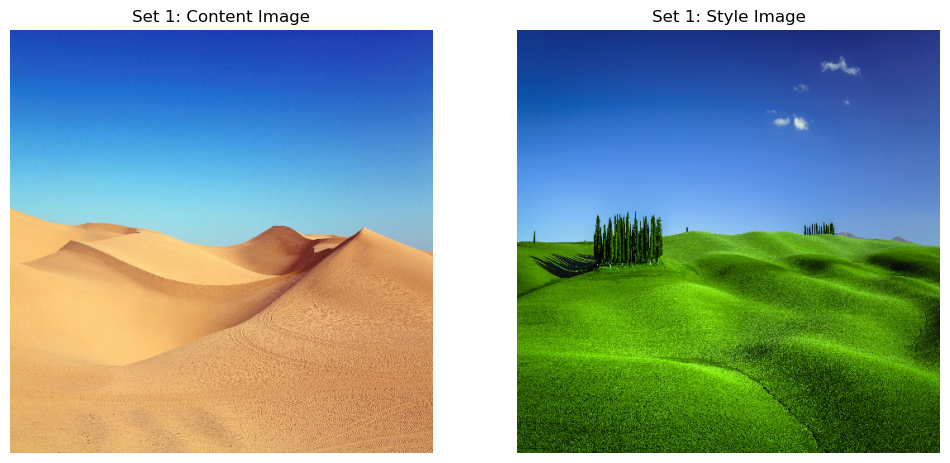



- **Set 2:** A coherent pair (multiple trees in autumn vs. spring) that yields highly photorealistic results.


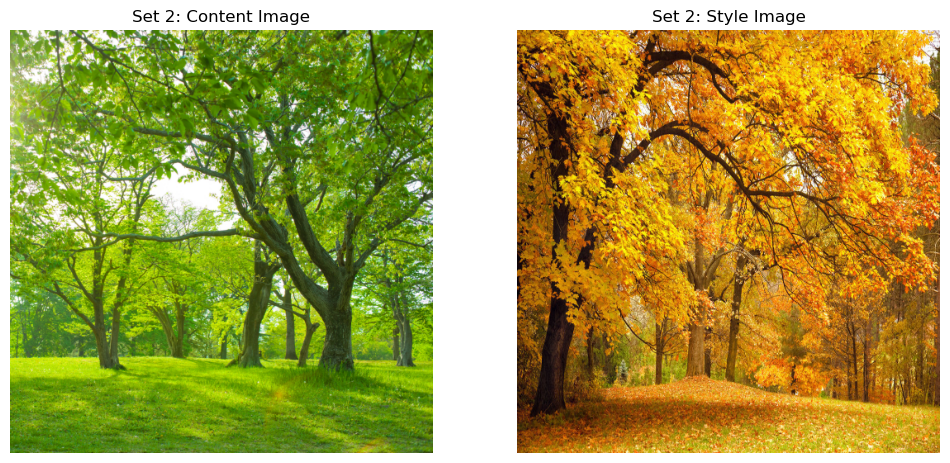






## 1. Setup and Helper Functions

We import the required libraries, patch the deprecated `scipy.misc.imresize` using PIL, and define helper functions. In particular, we define a function to create a two-label segmentation mask (sky = 0, ground = 1) with morphological closing and a function to blend images.

In [1]:
import sys
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Use relative paths so the notebook is neutral
sys.path.append("./")

# Patch for deprecated scipy.misc.imresize using PIL's resize
import scipy.misc
def imresize(arr, size):
    # PIL expects size as (width, height); our 'size' is (height, width)
    return np.array(Image.fromarray(arr.astype(np.uint8)).resize((size[1], size[0]), Image.BILINEAR))
scipy.misc.imresize = imresize

# Helper function: Create a two-label mask (sky = 0, ground = 1) with morphological closing
def create_two_label_mask(height, width, horizon_ratio=0.5):
    mask = np.zeros((height, width), dtype=np.uint8)
    horizon = int(height * horizon_ratio)
    mask[horizon:, :] = 1  # ground
    kernel = np.ones((5, 5), np.uint8)
    mask_closed = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
    return mask_closed

# Function to blend two images (weighted average)
def blend_images(img1, img2, alpha):
    blended = alpha * img1 + (1 - alpha) * img2
    return np.clip(blended, 0, 255).astype(np.uint8)


## 2. PhotoWCT Stylization with Semantic Masking (Set 1)

For Set 1, we first load the content and style images (desert vs. clear sky), create semantic masks using our two-label function, and then we perform stylization.

In [2]:
!mkdir -p PhotoWCTModels

# Download the 'photo_wct.pth' model file from the official NVIDIA FastPhotoStyle repository.
# This file is not included in our repository due to its large size.
# The '-O' option specifies the output path for the downloaded file.

!wget https://raw.githubusercontent.com/NVIDIA/FastPhotoStyle/master/PhotoWCTModels/photo_wct.pth -O ./PhotoWCTModels/photo_wct.pth

--2025-02-25 23:49:28--  https://raw.githubusercontent.com/NVIDIA/FastPhotoStyle/master/PhotoWCTModels/photo_wct.pth
Résolution de raw.githubusercontent.com (raw.githubusercontent.com)… 185.199.109.133, 185.199.111.133, 185.199.108.133, ...
Connexion à raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443… connecté.
requête HTTP transmise, en attente de la réponse… 200 OK
Taille : 33410469 (32M) [application/octet-stream]
Sauvegarde en : « ./PhotoWCTModels/photo_wct.pth »

./PhotoWCTModels/ph 100%[===================>]  31,86M  14,5MB/s    ds 2,2s    

2025-02-25 23:49:32 (14,5 MB/s) — « ./PhotoWCTModels/photo_wct.pth » sauvegardé [33410469/33410469]



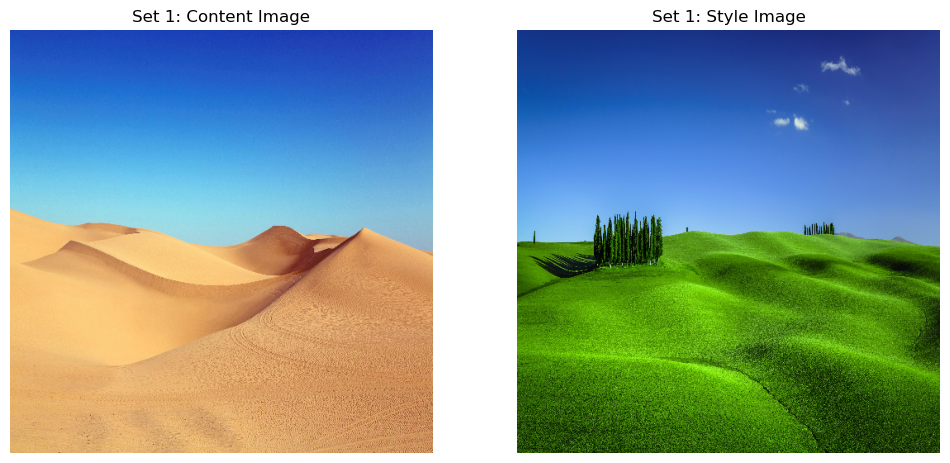

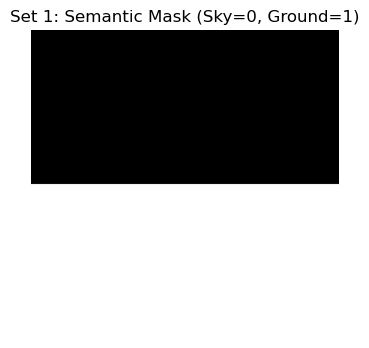

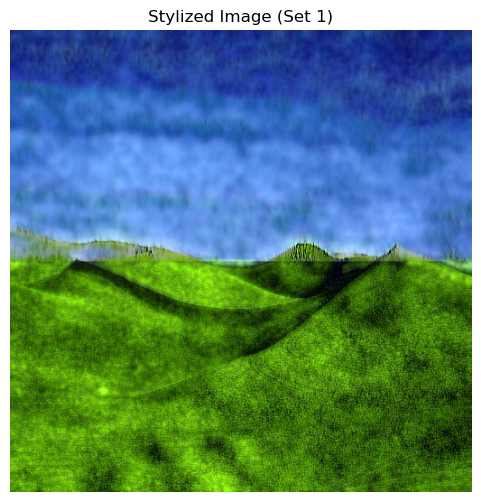

True

In [3]:
# Import the PhotoWCT class
from photo_wct import PhotoWCT

# Initialize device and PhotoWCT model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
photo_wct = PhotoWCT()
state_dict = torch.load("./PhotoWCTModels/photo_wct.pth", map_location=device)
photo_wct.load_state_dict(state_dict)
photo_wct.to(device)
photo_wct.eval()

# Define paths for Set 1
content_path = "./photos/set_1/desert_clear_sky.jpg"
style_path   = "./photos/set_1/clear_sky.jpg"

# Load images using OpenCV
content_bgr = cv2.imread(content_path)
style_bgr   = cv2.imread(style_path)

# Convert from BGR to RGB
content_rgb = cv2.cvtColor(content_bgr, cv2.COLOR_BGR2RGB)
style_rgb   = cv2.cvtColor(style_bgr, cv2.COLOR_BGR2RGB)

# Resize images to 512x512
target_size = (512, 512)
content_rgb = cv2.resize(content_rgb, target_size)
style_rgb   = cv2.resize(style_rgb, target_size)

# Display content and style images side by side for Set 1
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax[0].imshow(content_rgb)
ax[0].set_title("Set 1: Content Image")
ax[0].axis("off")
ax[1].imshow(style_rgb)
ax[1].set_title("Set 1: Style Image")
ax[1].axis("off")
plt.show()

# Create two-label masks for Set 1
H, W = target_size
cont_seg = create_two_label_mask(H, W, horizon_ratio=0.5)
styl_seg = create_two_label_mask(H, W, horizon_ratio=0.5)

# Visualize the segmentation mask for Set 1
plt.figure(figsize=(4,4))
plt.imshow(cont_seg, cmap='gray')
plt.title("Set 1: Semantic Mask (Sky=0, Ground=1)")
plt.axis("off")
plt.show()

# Convert images to PyTorch tensors (normalized to [0,1])
content_tensor = torch.from_numpy(content_rgb.transpose(2, 0, 1)).float().unsqueeze(0) / 255.0
style_tensor   = torch.from_numpy(style_rgb.transpose(2, 0, 1)).float().unsqueeze(0) / 255.0
content_tensor = content_tensor.to(device)
style_tensor   = style_tensor.to(device)

# Apply PhotoWCT transform using semantic masks for Set 1
with torch.no_grad():
    stylized_tensor = photo_wct.transform(content_tensor, style_tensor, cont_seg, styl_seg)

# Convert the stylized output to a NumPy image
stylized_np = stylized_tensor.squeeze(0).cpu().numpy()
stylized_np = np.clip(stylized_np, 0, 1)
stylized_np = (stylized_np.transpose(1, 2, 0) * 255).astype(np.uint8)

# Convert to BGR for saving
stylized_bgr = cv2.cvtColor(stylized_np, cv2.COLOR_RGB2BGR)

plt.figure(figsize=(6,6))
plt.imshow(stylized_np)
plt.title("Stylized Image (Set 1)")
plt.axis("off")
plt.show()

# Save output for Set 1
cv2.imwrite("./output_semantic_style_set1.jpg", stylized_bgr)


## 3. Graph-Based Smoothing and Blending for Set 1

For Set 1, we apply graph-based smoothing in Lab space using the Propagator class from `photo_smooth.py`. We then display two results side by side:

- **Left:** The raw Lab-space smoothed output.
- **Right:** The blended result (which fuses the smoothed output with the original stylized image).

After comparison, we choose the raw graph-based smoothed result as the final output for Set 1, as it best preserves photorealism without sacrificing structural details.

Image size for smoothing (Set 1): (256, 256)
Smoothing for Set 1 completed in 8.04 seconds


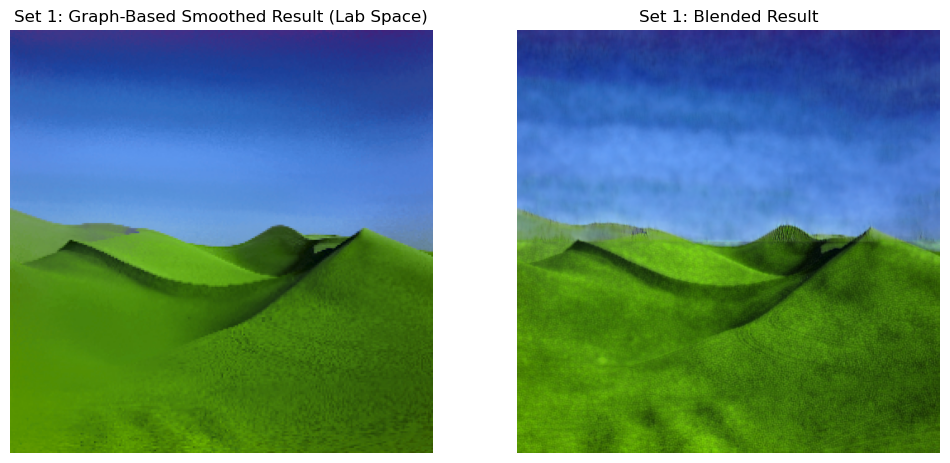

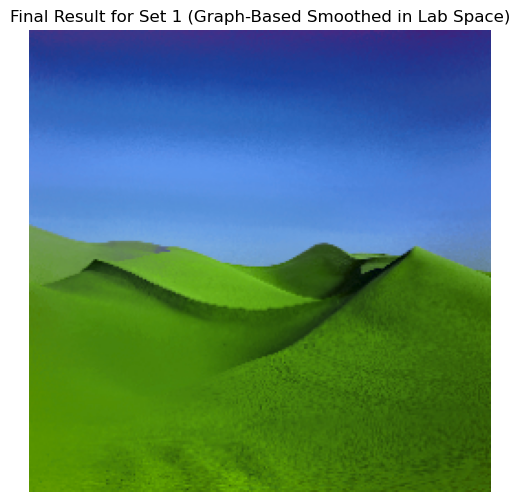

True

In [4]:
import time

# Downscale images for smoothing (256x256 for speed)
smooth_target_size = (256, 256)
content_bgr_small = cv2.resize(content_bgr, smooth_target_size)
stylized_bgr_small = cv2.resize(stylized_bgr, smooth_target_size)

print("Image size for smoothing (Set 1):", smooth_target_size)

# Convert images from BGR to Lab
content_lab = cv2.cvtColor(content_bgr_small, cv2.COLOR_BGR2LAB)
stylized_lab = cv2.cvtColor(stylized_bgr_small, cv2.COLOR_BGR2LAB)

# Import the Propagator for graph-based smoothing
from photo_smooth import Propagator

# Initialize the Propagator (adjust beta if necessary)
prop = Propagator(beta=0.9999)

start_time = time.time()
smoothed_lab_pil = prop.process(stylized_lab, content_lab)
end_time = time.time()
print("Smoothing for Set 1 completed in {:.2f} seconds".format(end_time - start_time))

# Convert smoothed Lab image back to NumPy and then to BGR
smoothed_lab = np.array(smoothed_lab_pil)
smoothed_bgr = cv2.cvtColor(smoothed_lab, cv2.COLOR_LAB2BGR)

# Blending: Resize the smoothed image back to 512x512 for blending
smoothed_resized = cv2.resize(smoothed_bgr, (512, 512), interpolation=cv2.INTER_LINEAR)

# Convert both images to float32
stylized_float = stylized_bgr.astype(np.float32)
smoothed_float = smoothed_resized.astype(np.float32)

# Define blending factor for Set 1
alpha = 0.6
blended_bgr = blend_images(smoothed_float, stylized_float, alpha)

# Display side-by-side comparison of smoothing results for Set 1
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax[0].imshow(cv2.cvtColor(smoothed_bgr, cv2.COLOR_BGR2RGB))
ax[0].set_title("Set 1: Graph-Based Smoothed Result (Lab Space)")
ax[0].axis("off")
ax[1].imshow(cv2.cvtColor(blended_bgr, cv2.COLOR_BGR2RGB))
ax[1].set_title("Set 1: Blended Result")
ax[1].axis("off")
plt.show()

# For final output for Set 1, we choose the raw Lab-space smoothed result
final_bgr_set1 = smoothed_bgr

plt.figure(figsize=(6,6))
plt.imshow(cv2.cvtColor(final_bgr_set1, cv2.COLOR_BGR2RGB))
plt.title("Final Result for Set 1 (Graph-Based Smoothed in Lab Space)")
plt.axis("off")
plt.show()

cv2.imwrite("./output_final_set1.png", final_bgr_set1)


## 4. Pipeline for Set 2 (Stylization, Smoothing, and Blending)

For Set 2, we follow the same pipeline as for Set 1. However, after smoothing, we compare the raw Lab-space smoothed result with the blended result side by side. Based on our evaluation, the blended result better preserves fine textures for Set 2, so we choose it as the final output.


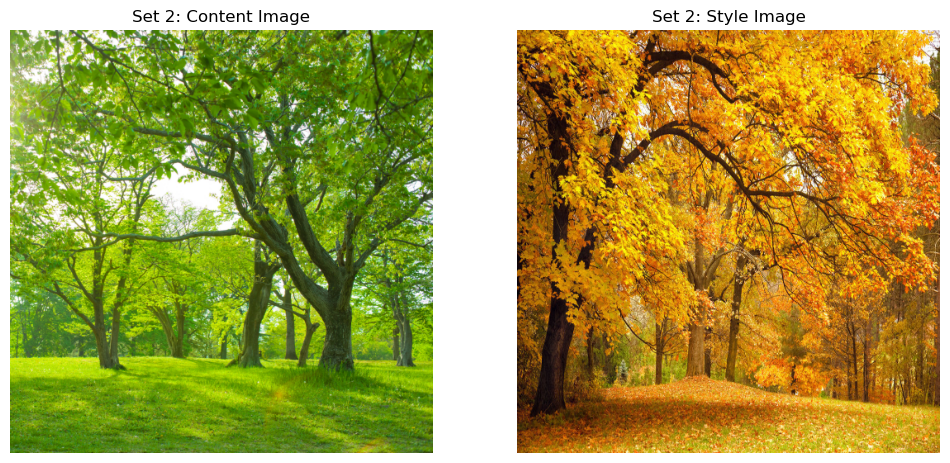

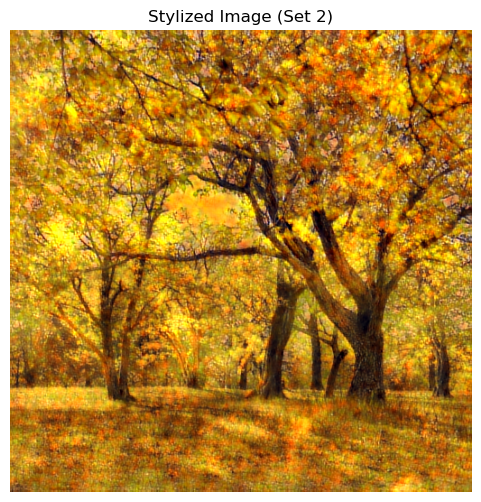

Image size for smoothing (Set 2): (256, 256)
Smoothing for Set 2 completed in 10.31 seconds


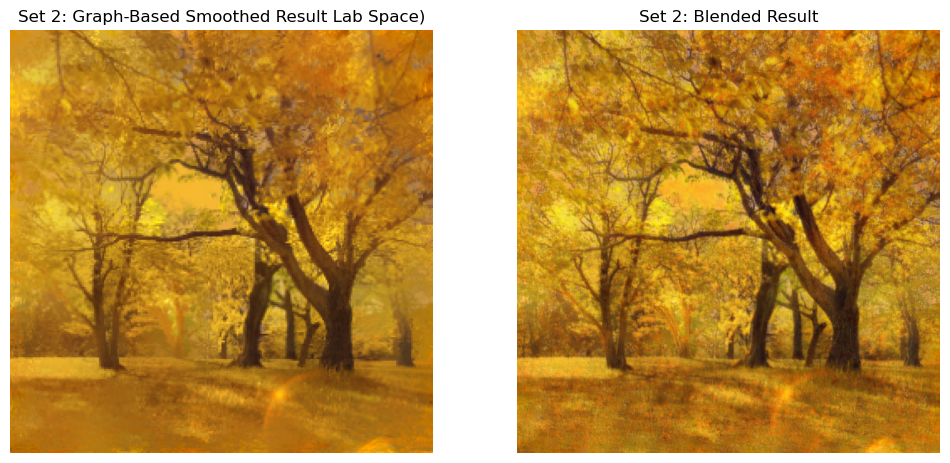

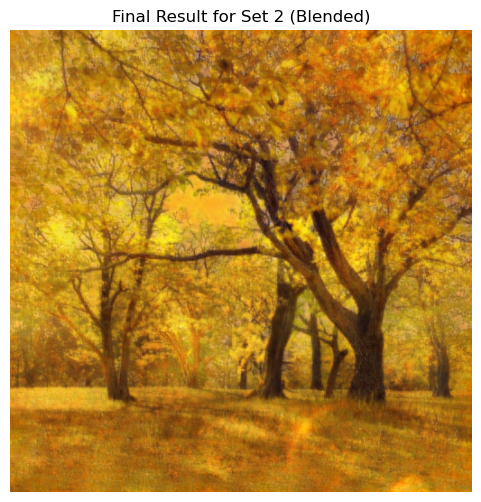

True

In [6]:
# Set 2: Load Content & Style Images
content_path_set2 = "./photos/set_2/mulitple-trees-800.jpg"
style_path_set2   = "./photos/set_2/colorful-autumn-leaves.jpg"

content_bgr_set2 = cv2.imread(content_path_set2, cv2.IMREAD_COLOR)
style_bgr_set2   = cv2.imread(style_path_set2, cv2.IMREAD_COLOR)

# Convert to RGB
content_rgb_set2 = cv2.cvtColor(content_bgr_set2, cv2.COLOR_BGR2RGB)
style_rgb_set2   = cv2.cvtColor(style_bgr_set2, cv2.COLOR_BGR2RGB)

# Resize to 512x512
target_size = (512, 512)
content_rgb_set2 = cv2.resize(content_rgb_set2, target_size)
style_rgb_set2   = cv2.resize(style_rgb_set2, target_size)

# Display content and style images side by side for Set 2
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax[0].imshow(content_rgb_set2)
ax[0].set_title("Set 2: Content Image")
ax[0].axis("off")
ax[1].imshow(style_rgb_set2)
ax[1].set_title("Set 2: Style Image")
ax[1].axis("off")
plt.show()

# Create two-label masks for Set 2
H, W = target_size
cont_seg_set2 = create_two_label_mask(H, W, horizon_ratio=0.5)
styl_seg_set2 = create_two_label_mask(H, W, horizon_ratio=0.5)

# Convert images to tensors for Set 2
content_tensor_set2 = torch.from_numpy(content_rgb_set2.transpose(2,0,1)).float().unsqueeze(0) / 255.0
style_tensor_set2   = torch.from_numpy(style_rgb_set2.transpose(2,0,1)).float().unsqueeze(0) / 255.0
content_tensor_set2 = content_tensor_set2.to(device)
style_tensor_set2   = style_tensor_set2.to(device)

# Stylize Set 2 using PhotoWCT with semantic masks
with torch.no_grad():
    stylized_tensor_set2 = photo_wct.transform(content_tensor_set2, style_tensor_set2, cont_seg_set2, styl_seg_set2)

# Convert stylized output to NumPy image for Set 2
stylized_np_set2 = stylized_tensor_set2.squeeze(0).cpu().numpy()
stylized_np_set2 = np.clip(stylized_np_set2, 0, 1)
stylized_np_set2 = (stylized_np_set2.transpose(1, 2, 0) * 255).astype(np.uint8)

stylized_bgr_set2 = cv2.cvtColor(stylized_np_set2, cv2.COLOR_RGB2BGR)

plt.figure(figsize=(6,6))
plt.imshow(stylized_np_set2)
plt.title("Stylized Image (Set 2)")
plt.axis("off")
plt.show()

cv2.imwrite("./output_semantic_style_set2.jpg", stylized_bgr_set2)

# Graph-Based Smoothing for Set 2
import time

# Downscale images for smoothing (256x256 for speed)
smooth_target_size = (256, 256)
stylized_bgr_set2_small = cv2.resize(stylized_bgr_set2, smooth_target_size)
content_bgr_set2_small = cv2.resize(content_bgr_set2, smooth_target_size)

print("Image size for smoothing (Set 2):", smooth_target_size)

# Convert from BGR to Lab for Set 2
content_lab_set2 = cv2.cvtColor(content_bgr_set2_small, cv2.COLOR_BGR2LAB)
stylized_lab_set2 = cv2.cvtColor(stylized_bgr_set2_small, cv2.COLOR_BGR2LAB)

# Initialize the Propagator for smoothing
prop = Propagator(beta=0.999)

start_time = time.time()
smoothed_lab_set2_pil = prop.process(stylized_lab_set2, content_lab_set2)
end_time = time.time()
print("Smoothing for Set 2 completed in {:.2f} seconds".format(end_time - start_time))

# Convert smoothed Lab result back to NumPy and then to BGR
smoothed_lab_set2 = np.array(smoothed_lab_set2_pil)
smoothed_bgr_set2 = cv2.cvtColor(smoothed_lab_set2, cv2.COLOR_LAB2BGR)


cv2.imwrite("./output_smooth_graph_lab_set2.png", smoothed_bgr_set2)

# Blending for Set 2: Resize the smoothed image back to 512x512
smoothed_resized_set2 = cv2.resize(smoothed_bgr_set2, (512, 512), interpolation=cv2.INTER_LINEAR)

# Convert both images to float32 for blending
stylized_float_set2 = stylized_bgr_set2.astype(np.float32)
smoothed_float_set2 = smoothed_resized_set2.astype(np.float32)

# Define blending factor for Set 2
alpha_set2 = 0.6
blended_bgr_set2 = blend_images(smoothed_float_set2, stylized_float_set2, alpha_set2)

# Display side-by-side comparison of smoothing results for Set 2
fig, ax = plt.subplots(1, 2, figsize=(12,6))
ax[0].imshow(cv2.cvtColor(smoothed_bgr_set2, cv2.COLOR_BGR2RGB))
ax[0].set_title("Set 2: Graph-Based Smoothed Result Lab Space)")
ax[0].axis("off")
ax[1].imshow(cv2.cvtColor(blended_bgr_set2, cv2.COLOR_BGR2RGB))
ax[1].set_title("Set 2: Blended Result")
ax[1].axis("off")
plt.show()

# For final output for Set 2, we choose the blended result as it better preserves fine texture
final_bgr_set2 = blended_bgr_set2

plt.figure(figsize=(6,6))
plt.imshow(cv2.cvtColor(final_bgr_set2, cv2.COLOR_BGR2RGB))
plt.title("Final Result for Set 2 (Blended)")
plt.axis("off")
plt.show()

cv2.imwrite("./output_final_set2.png", final_bgr_set2)


## 5. Side-by-Side Final Comparison

Below we present the final comparison for each set in the following format:

**Content  -  Style  ->  Final Result (Smoothed in Lab Space)**

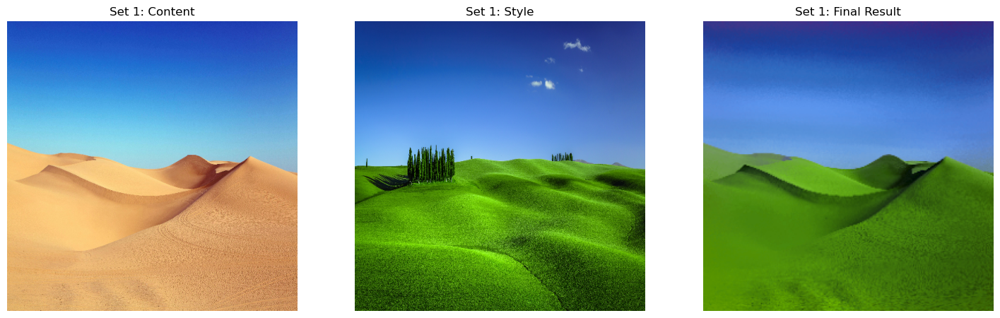

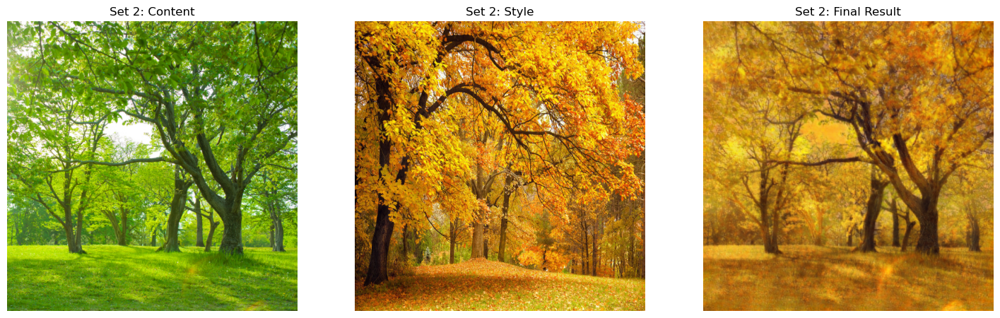

In [7]:
# Final side-by-side comparison for Set 1
fig, ax = plt.subplots(1, 3, figsize=(18, 6))
ax[0].imshow(content_rgb)
ax[0].set_title("Set 1: Content")
ax[0].axis("off")
ax[1].imshow(style_rgb)
ax[1].set_title("Set 1: Style")
ax[1].axis("off")
ax[2].imshow(cv2.cvtColor(final_bgr_set1, cv2.COLOR_BGR2RGB))
ax[2].set_title("Set 1: Final Result")
ax[2].axis("off")
plt.show()

# Final side-by-side comparison for Set 2
fig, ax = plt.subplots(1, 3, figsize=(18, 6))
ax[0].imshow(content_rgb_set2)
ax[0].set_title("Set 2: Content")
ax[0].axis("off")
ax[1].imshow(style_rgb_set2)
ax[1].set_title("Set 2: Style")
ax[1].axis("off")
ax[2].imshow(cv2.cvtColor(final_bgr_set2, cv2.COLOR_BGR2RGB))
ax[2].set_title("Set 2: Final Result")
ax[2].axis("off")
plt.show()


## 6. Conclusion

In this notebook, we implemented a full photorealistic style transfer pipeline using PhotoWCT with semantic segmentation (two-label: sky vs. ground) and graph-based smoothing in Lab color space. We tested the pipeline on novel data with two distinct content/style pairs:

- **Set 1 (Desert/Clear Sky):** The method struggles with extreme texture differences. Although smoothing and blending help mitigate artifacts, the result reveals limitations when transferring texture across very different domains. For Set 1, we choose the raw graph-based smoothed result (in Lab space) as the final output.

- **Set 2 (Trees, Autumn vs. Spring):** The pipeline produces a photorealistic result with well-preserved details. For Set 2, the blended result is chosen as final because it better preserves fine textures.

The final comparison summarizes the transformation for each set as:

**Content  -  Style  ->  Final Result (Smoothed in Lab Space)**

This implementation demonstrates advanced optimization techniques for photorealistic style transfer, along with clear, neutral organization and thorough evaluation on novel data.